In [1]:
import warnings
import scanpy as sc
import squidpy as sq
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pickle

import time
from tqdm.notebook import tqdm
import requests
import utils.de_utils as de_utils

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

/env/lib/python3.11/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/env/lib/python3.11/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/env/lib/python3.11/site-packages/anndata/utils.py:434: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)


# Global variables

In [2]:
specie = "macaque"

In [3]:
results_dir = 'data/validate_layers/'

In [4]:
figures_dir = f'validate_layers/{specie}/figures/'
os.makedirs(figures_dir, exist_ok=True)

In [5]:
layers = ['L1', 'L2', 'L3', 'L4', 'L5', "L6", 'WM']

In [6]:
cluster_color = ['red', 'yellow', 'orange', 'green', 'purple', 'blue', 'olive', 'pink', 'brown']

In [7]:
os.listdir(results_dir)

['adultsDE',
 'annotation.csv',
 'chimpDE',
 'chimp_de.pkl',
 'expression.csv',
 'humanDE',
 'human_de.pkl',
 'macaqueDE',
 'macaque_de.pkl']

## Load files

### Load pseudobulk files

In [8]:
pb_dir_path = 'data/pseudobulks/'

In [9]:
os.listdir('data/pseudobulks/')

['pb_age.h5ad',
 'pb_chimp.h5ad',
 'pb_human.h5ad',
 'pb_macaque.h5ad',
 'pb_mammals.h5ad',
 'pb_spatial_libd_human.h5ad',
 'pseudobulk_all_four.h5ad',
 'pseudobulk_all_mammals.h5ad',
 'pseudobulk_humans.h5ad']

In [10]:
adata_pb = sc.read_h5ad(pb_dir_path + 'pseudobulk_all_four.h5ad')
adata_pb = adata_pb[adata_pb.obs.sample_id != 'chimp_13302'].copy()
adata_pb

AnnData object with n_obs × n_vars = 165 × 15367
    obs: 'layer', 'sample_id', 'psbulk_cells', 'psbulk_counts', 'condition'
    var: 'feature_types', 'mt', 'hb', 'ribo'
    uns: 'X_pca_mean_norm', 'condition_colors', 'layer_colors', 'log1p', 'pca'
    obsm: 'X_pca', 'X_pca_mean_norm'
    varm: 'PCs', 'X_pca_mean_norm'
    layers: 'counts', 'mean_norm', 'psbulk_props'

### DE results

In [11]:
os.listdir(results_dir + f'{specie}DE')

['degenes_L1.csv',
 'degenes_L2.csv',
 'degenes_L3.csv',
 'degenes_L4.csv',
 'degenes_L5.csv',
 'degenes_L6.csv',
 'degenes_WM.csv']

## Preprocess results

Load results

In [12]:
de_results = {layer:pd.read_csv(results_dir + f'{specie}DE/degenes_{layer}.csv', index_col=0) for layer in layers}

In [13]:
de_results['L1'].head()

,logFC,logCPM,F,PValue
DUSP18,0.060435,8.983704,0.331179,0.569188
ANGPTL4,0.376327,8.883711,7.362158,0.017236
NUP133,-0.007654,9.051368,0.007830,0.929950
FKBP7,-0.051061,8.907887,0.067420,0.798215
ECI2,0.567281,8.931989,19.511438,0.000240


Add multiple-test correction

In [14]:
de_utils.multipletest_correction(de_results)

In [15]:
de_results['L1'].head()

,logFC,logCPM,F,PValue,p_val_adj
DUSP18,0.060435,8.983704,0.331179,0.569188,0.772945
ANGPTL4,0.376327,8.883711,7.362158,0.017236,0.077159
NUP133,-0.007654,9.051368,0.007830,0.929950,0.972433
FKBP7,-0.051061,8.907887,0.067420,0.798215,0.909223
ECI2,0.567281,8.931989,19.511438,0.000240,0.002421


Save resulting dict

In [16]:
with open(f'{results_dir}/{specie}_de.pkl', 'wb') as f:
    pickle.dump(de_results, f)

## Summary

Calculate a number of significantly different genes

In [17]:
de_utils.summary_de(de_results)

,L1,L2,L3,L4,L5,L6,WM
up_reg,846,726,1054,872,740,282,1271
not_sign,6176,6420,5988,6234,6395,7147,5135
down_reg,669,545,649,585,556,262,1285


A voolcano plots for each comparison

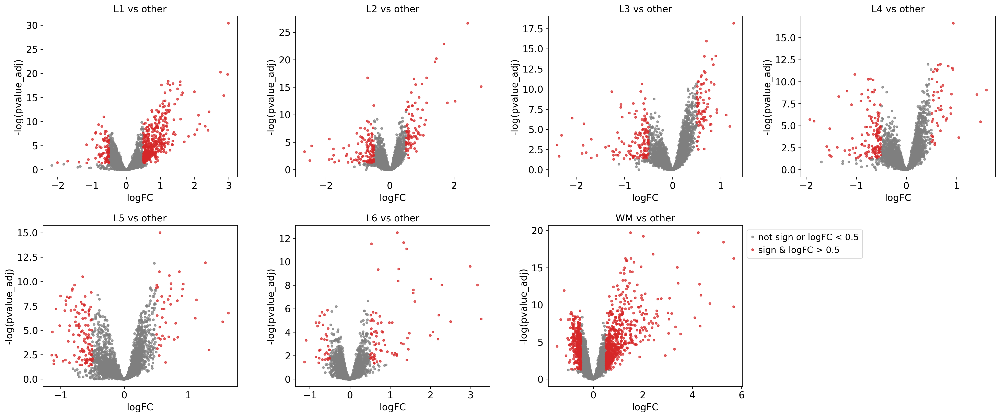

In [18]:
fig, axes = plt.subplots(2, 4,  figsize=(25, 10), gridspec_kw={'hspace': 0.3, 'wspace': 0.3}, dpi=120)
#fig, ax = plt.subplots(1, 1,  figsize=(7, 5), gridspec_kw={'hspace': 0.5})

for (layer, df), ax in zip(de_results.items(), axes.flatten()):
    sign_tr = ((df.p_val_adj < 0.05) & (df.logFC > 1))
    filter_cond = ((df.p_val_adj < 0.05) & (df.logFC.abs() > 0.5))
    ax.plot(df[~filter_cond].logFC, -np.log10(df[~filter_cond].p_val_adj), '.', c='tab:gray', alpha=0.7)
    ax.plot(df[filter_cond].logFC, -np.log10(df[filter_cond].p_val_adj), '.', c='tab:red', alpha=0.7)
    ax.grid(False)
    ax.set_title(f'{layer} vs other')
    ax.set_ylabel('-log(pvalue_adj)')
    ax.set_xlabel('logFC')
    if layer == 'WM':
        ax.legend(['not sign or logFC < 0.5', 'sign & logFC > 0.5'], loc="upper left", bbox_to_anchor=(1,1))
fig.delaxes(axes[1, 3])
fig.savefig(figures_dir + 'volcano.jpg', bbox_inches='tight')

Let's see a number of significant genes for each layer and their intersection

In [19]:
sign_genes = {layer: df[(df.p_val_adj < 0.05) & (df.logFC > 0)].index for layer, df in de_results.items()}

In [20]:
count_df, unique_genes = de_utils.count_unique(sign_genes)

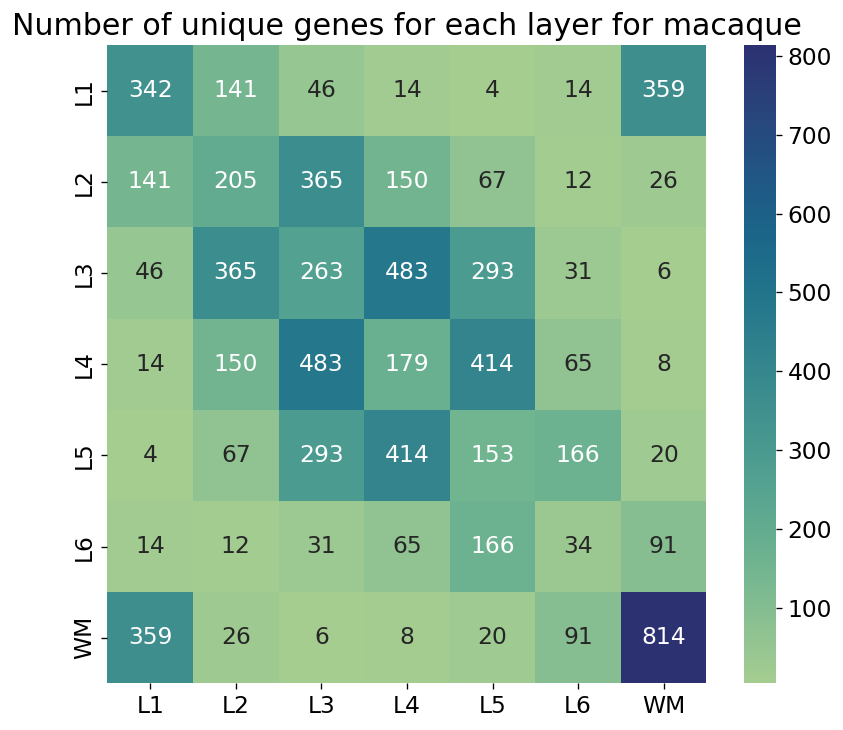

In [21]:
plt.figure(figsize=(8, 7), dpi=60)
sns.heatmap(count_df, annot=True, cmap = 'crest', fmt=".0f")
plt.title(f'Number of unique genes for each layer for {specie}', fontsize=18)
plt.grid(False)
plt.savefig(figures_dir + 'unique_genes.jpg', bbox_inches='tight')

## Marker genes

### Select marker genes

Let's find marker genes for each layer. We will define them in the following way:
1. The logFC has to be positive
2. Adjusted p-value has to be less than 0.05
3. This has to be the layer with the greatest logFC
4. The difference of logFC for the second biggest layer has to be greater than threashold value

In [22]:
logFC_list = list()

# find genes that has logFC > 0 and p-val < 0.05
for layer, df in de_results.items():
    logFC = df[(df.p_val_adj < 0.05) & (df.logFC > 0)].logFC
    logFC.name = layer
    logFC_list.append(logFC)

# concat logFC values for all layers
logFC_df = pd.concat(logFC_list, axis=1)

# find the layer with the greatest logFC
marker_df = logFC_df.idxmax(axis=1).to_frame(name='layer')
marker_df['logFC'] = logFC_df.max(axis=1)

# find layer with second largest logFC
logFC_df_sec = logFC_df.apply(lambda x: x[x != x.max()], axis=1) # set first layer values to NaN
marker_df['second largest layer'] = logFC_df_sec.idxmax(axis=1)
marker_df['second largest logFC'] = logFC_df_sec.max(axis=1)

# calculate logFC for layer 1 and layer 2
marker_df['logFC_12'] = (6 / 5) * (marker_df['logFC'] - marker_df['second largest logFC'])

# check genes with non NaN logFC_12
marker_df[marker_df.logFC_12.notna()].head()

,layer,logFC,second largest layer,second largest logFC,logFC_12
ECI2,WM,0.596623,L1,0.567281,0.035210
IDH2,L2,0.310820,L3,0.307048,0.004526
YJEFN3,L1,0.181107,L2,0.165202,0.019085
LAPTM5,WM,0.860999,L1,0.611281,0.299662
CX3CR1,WM,1.044360,L1,0.639505,0.485827


Count number of marker genes for each layer

In [23]:
marker_df.layer.value_counts().to_frame().T

layer,WM,L3,L1,L4,L5,L2,L6
count,1086,622,601,409,402,376,125


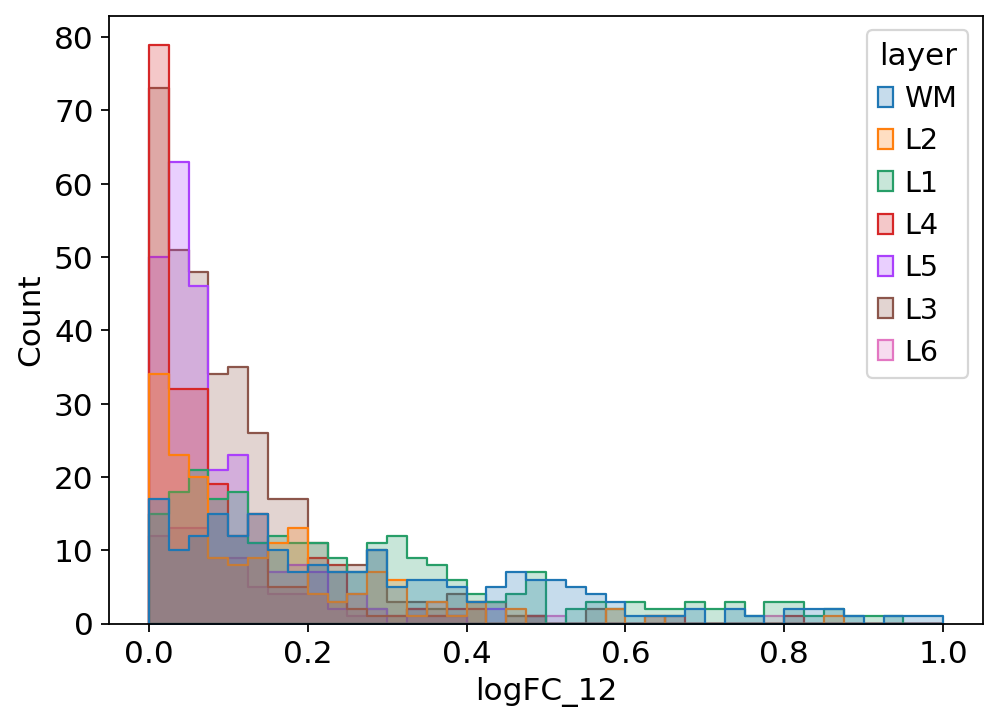

In [24]:
plt.figure(figsize=(7, 5))
sns.histplot(marker_df, x='logFC_12', binrange=[0, 1], hue='layer', element="step", bins=40)
plt.grid(False)

### Visualise marker genes without threashold

Let's select top20 marker genes for each layer

In [25]:
marker_df['rank'] = marker_df.groupby('layer')['logFC'].rank(method='dense', ascending=False)
top20_genes = marker_df[marker_df['rank'] < 20].sort_values(by=['layer', 'rank'])
top20_genes

,layer,logFC,second largest layer,second largest logFC,logFC_12,rank
VIM,L1,2.989875,WM,1.271631,2.061893,1.0
CXCL14,L1,2.963016,L2,1.117562,2.214545,2.0
COL1A1,L1,2.849343,NaN,NaN,NaN,3.0
IGF2,L1,2.757352,NaN,NaN,NaN,4.0
COL1A2,L1,2.423835,NaN,NaN,NaN,5.0
...,...,...,...,...,...,...
PLLP,WM,3.161106,L6,1.161673,2.399319,15.0
APOD,WM,3.084019,L6,1.161811,2.306649,16.0
PPP1R14A,WM,3.054335,L6,1.326869,2.072959,17.0
FA2H,WM,3.037475,L6,1.043827,2.392378,18.0


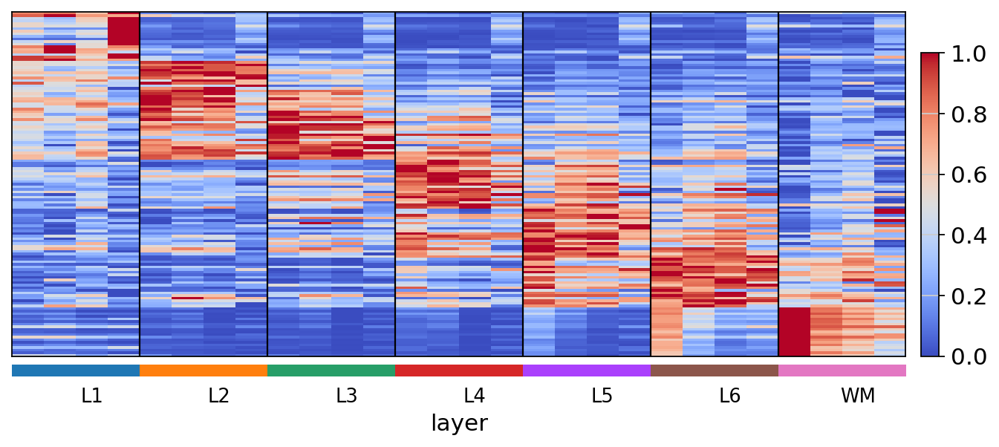

In [26]:
top = 20
marker_top_list = marker_df[marker_df['rank'] < top].sort_values(by=['layer', 'rank']).index.to_list()
sc.pl.heatmap(adata_pb[adata_pb.obs.condition == specie, :], marker_top_list, groupby='layer', swap_axes=True, standard_scale='var', cmap='coolwarm', show=False)
plt.savefig(figures_dir + 'top_genes_heatmap.jpg', bbox_inches='tight')

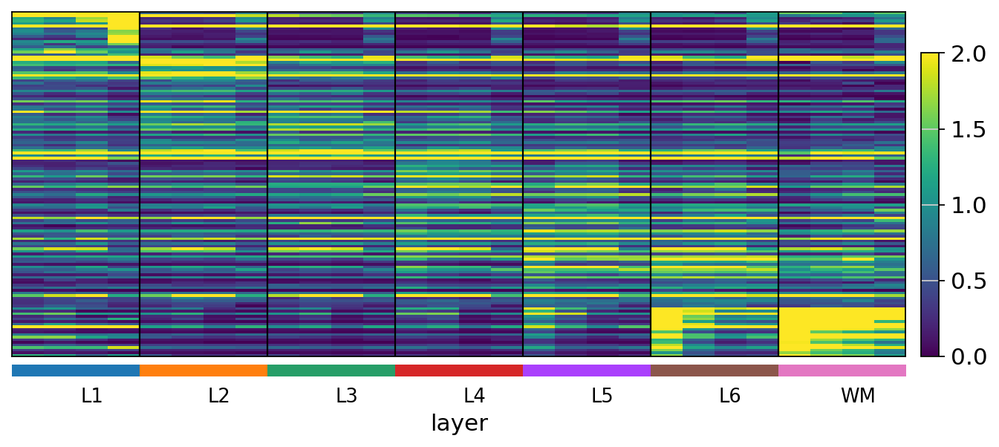

In [27]:
top = 20
marker_top_list = marker_df[marker_df['rank'] < top].sort_values(by=['layer', 'rank']).index.to_list()
sc.pl.heatmap(adata_pb[adata_pb.obs.condition == specie, :], marker_top_list, groupby='layer', swap_axes=True, vmax=2)

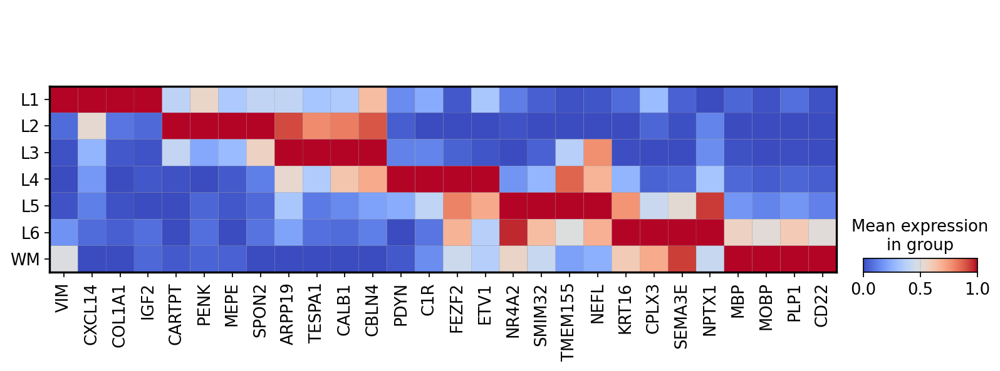

In [28]:
top = 5
marker_top_list = marker_df[marker_df['rank'] < top].sort_values(by=['layer', 'rank']).index.to_list()
sc.pl.matrixplot(adata_pb[adata_pb.obs.condition == specie, :], marker_top_list, groupby='layer', swap_axes=False, standard_scale='var', cmap='coolwarm', show=False)
plt.savefig(figures_dir + 'top_genes_matrixplot.jpg', bbox_inches='tight')

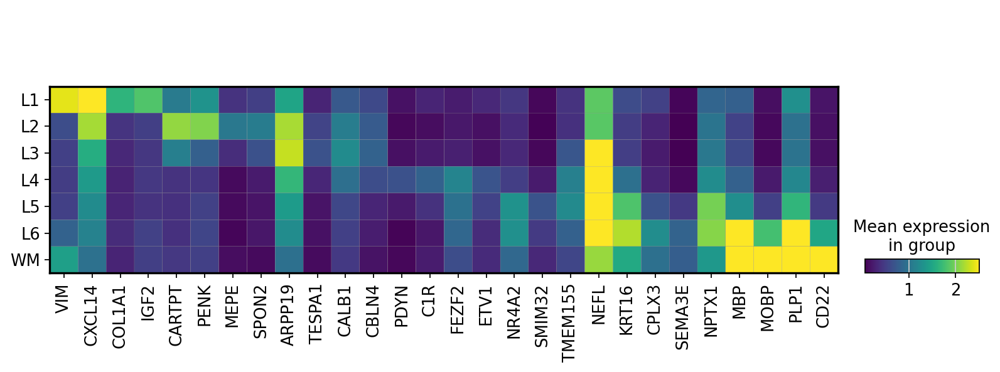

In [29]:
top = 5
marker_top_list = marker_df[marker_df['rank'] < top].sort_values(by=['layer', 'rank']).index.to_list()
sc.pl.matrixplot(adata_pb[adata_pb.obs.condition == specie, :], marker_top_list, groupby='layer', swap_axes=False, vmax=2.5)

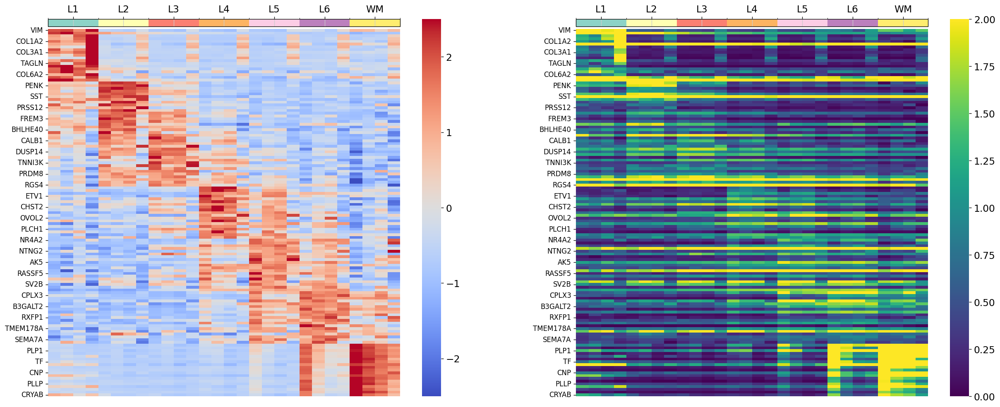

In [30]:
from scipy.stats import zscore

fig, (ax, ax2) = plt.subplots(1, 2, figsize=(25, 10), dpi=60)

top = 20
marker_top_list = marker_df[marker_df['rank'] < top].sort_values(by=['layer', 'rank']).index.to_list()
adata_subs = adata_pb[adata_pb.obs.condition == specie, marker_top_list]

expr_df = pd.DataFrame(adata_subs.X, index=adata_subs.obs_names, columns=marker_top_list)

de_utils.heatmap_annot(expr_df.apply(zscore).T, adata_subs.obs.layer, fig, ax, cmap='coolwarm', center=0, vmin=-2.5, vmax=2.5, xticklabels=False)
de_utils.heatmap_annot(expr_df.T, adata_subs.obs.layer, fig, ax2, vmax=2, xticklabels=False, cmap='viridis')
plt.savefig(figures_dir + 'top_genes_heatmap_annot.jpg', bbox_inches='tight')

## Visualise markers on Visium slides

### Load and process Visium data

In [31]:
# load data
adata_sp = sc.read_h5ad(f'data/raw_adata/{specie}.h5ad')
adata_sp.obs_names_make_unique()
adata_sp

/env/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 14621 × 21591
    obs: 'in_tissue', 'array_row', 'array_col', 'label', 'sample_id'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [32]:
# normalize data
sc.pp.normalize_total(adata_sp, target_sum=1e4)
sc.pp.log1p(adata_sp)

normalizing counts per cell
    finished (0:00:00)


### Filted marker genes

Let's select marker genes based on the logFC value and expression percent

In [33]:
ranked_genes = de_utils.rank_degenes(de_results, adata_sp, marker_df, logfc=0.6, pct=0.2)
for key in ranked_genes.keys():
    print(f'{key}: {ranked_genes[key].shape[0]}')

L1: 85
L2: 36
L3: 32
L4: 26
L5: 14
L6: 0
WM: 200


/workspace/utils/de_utils.py:108: RuntimeWarning: invalid value encountered in divide
  pct_vector = np.sign(adata_subs.X.toarray()).sum(axis=0) / n_obs


In [34]:
top_ranked_genes = [rank.index[1] for rank in ranked_genes.values() if not rank.empty]

### Visualize top genes

Visualize top gene

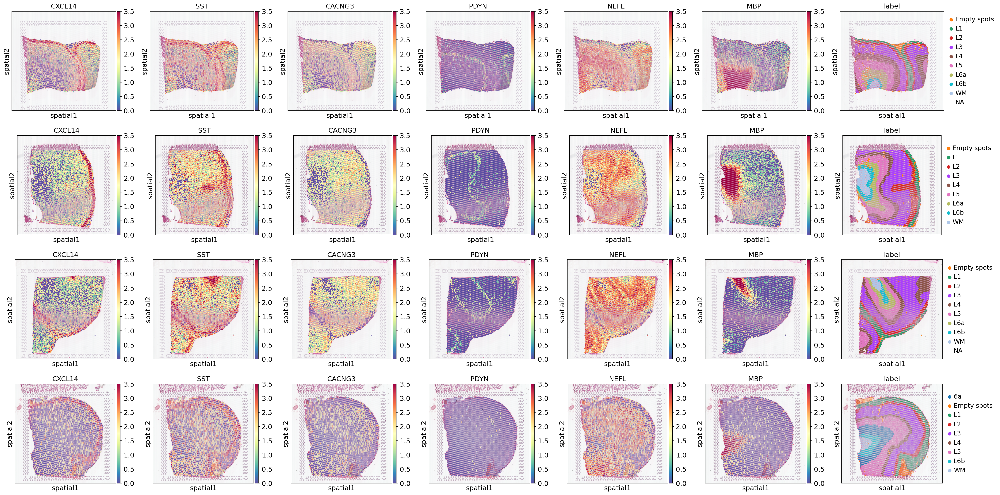

In [35]:
#cmap = mpl.cm.viridis
cmap = mpl.cm.Spectral_r
norm = mpl.colors.Normalize(vmin=0, vmax=3.5, clip=True)

sq.pl.spatial_scatter(adata_sp,
                      color=top_ranked_genes + ['label'],
                      library_key='sample_id', ncols=len(top_ranked_genes) + 1, img=True, size=1.3, cmap=cmap, norm=norm)
plt.savefig(figures_dir + f'topgenes_spatial.jpg', bbox_inches='tight')

### Visualize average expression

To visualize average marker gene expression on Visium slides we need to scale the data

In [36]:
marker_genes = []
for layer, genes in ranked_genes.items():
    if not genes.empty:
        marker_genes += genes.index.tolist()

In [37]:
scaled_adata_list = list()
for sample in adata_sp.obs.sample_id.unique():
    scaled_adata_list.append(sc.pp.scale(adata_sp[adata_sp.obs.sample_id == sample, marker_genes], copy=True))

scaled_adata = an.concat(scaled_adata_list , merge='same',uns_merge="unique")
scaled_adata

/root/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
/root/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
/root/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
/root/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


AnnData object with n_obs × n_vars = 14621 × 393
    obs: 'in_tissue', 'array_row', 'array_col', 'label', 'sample_id'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial', 'log1p'
    obsm: 'spatial'

Calculate weighted average expression

In [38]:
for layer in ranked_genes.keys():
    if not ranked_genes[layer].empty:
        genes = ranked_genes[layer].index
        scaled_adata.obs[f'{layer}_scaled'] = np.average(scaled_adata[:, genes].X, axis=1, weights=ranked_genes[layer].F.values)

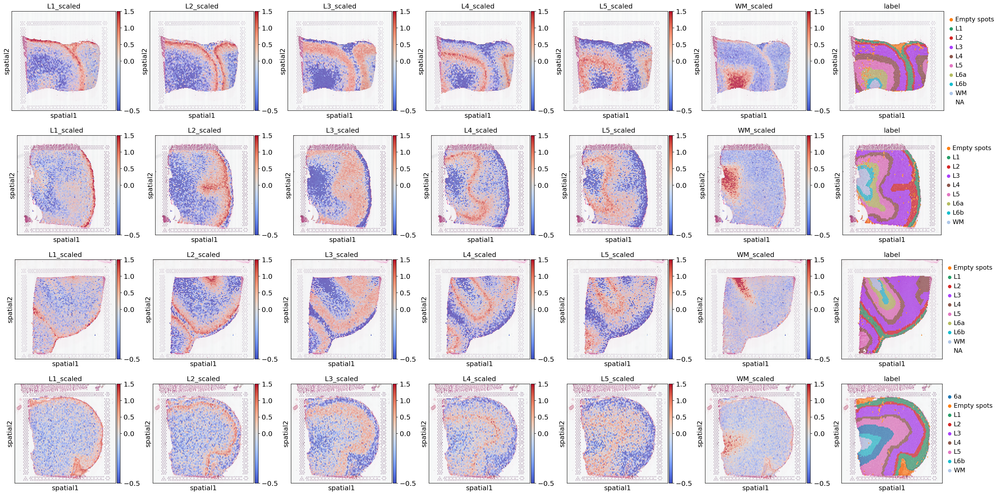

In [39]:
cmap = mpl.cm.coolwarm
norm = mpl.colors.TwoSlopeNorm(vcenter=0, vmin=-0.5, vmax=1.5)

sq.pl.spatial_scatter(scaled_adata,
                      color=['L1_scaled', 'L2_scaled', 'L3_scaled', 'L4_scaled', 'L5_scaled', 'WM_scaled', 'label'],
                      library_key='sample_id', ncols=7, img=True, size=1.3, cmap=cmap, norm=norm)
plt.savefig(figures_dir + 'scaled_layers.jpg', bbox_inches='tight')